In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import numpy as np
from scipy.stats import pearsonr


In [3]:
data = pd.read_csv('DS.csv')
print(data[['Restaurant Name', 'City', 'Country Code', 'Latitude', 'Longitude', 'Aggregate rating']].head())


          Restaurant Name              City  Country Code   Latitude  \
0        Le Petit Souffle       Makati City           162  14.565443   
1        Izakaya Kikufuji       Makati City           162  14.553708   
2  Heat - Edsa Shangri-La  Mandaluyong City           162  14.581404   
3                    Ooma  Mandaluyong City           162  14.585318   
4             Sambo Kojin  Mandaluyong City           162  14.584450   

    Longitude  Aggregate rating  
0  121.027535               4.8  
1  121.014101               4.5  
2  121.056831               4.4  
3  121.056475               4.9  
4  121.057508               4.8  


In [5]:
data = data.dropna(subset=['Latitude', 'Longitude', 'Aggregate rating'])
data['Aggregate rating'] = pd.to_numeric(data['Aggregate rating'], errors='coerce')
data = data.dropna(subset=['Aggregate rating'])
data.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270


In [6]:
# Creating map using lats and lons
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)

# Add restaurant markers with clustering
marker_cluster = MarkerCluster().add_to(restaurant_map)

for idx, row in data.iterrows():
    popup_text = f"{row['Restaurant Name']}<br>Rating: {row['Aggregate rating']}<br>City: {row['City']}"
    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=popup_text).add_to(marker_cluster)

# Save or display the map
restaurant_map.save('restaurant_map.html')

C:\Users\Eswar\AppData\Local\Temp\ipykernel_2716\3864415900.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities['Restaurant Count'], y=top_cities.index, palette='Blues_d')


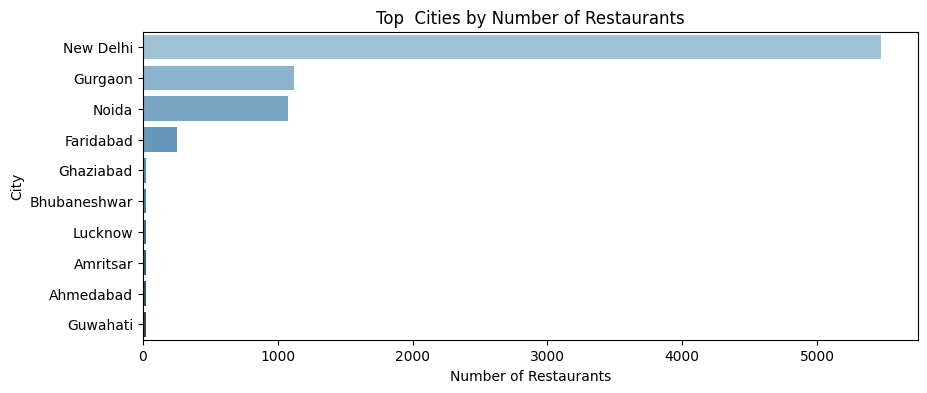

C:\Users\Eswar\AppData\Local\Temp\ipykernel_2716\3864415900.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities['Aggregate rating'], y=top_cities.index, palette='Greens_d')


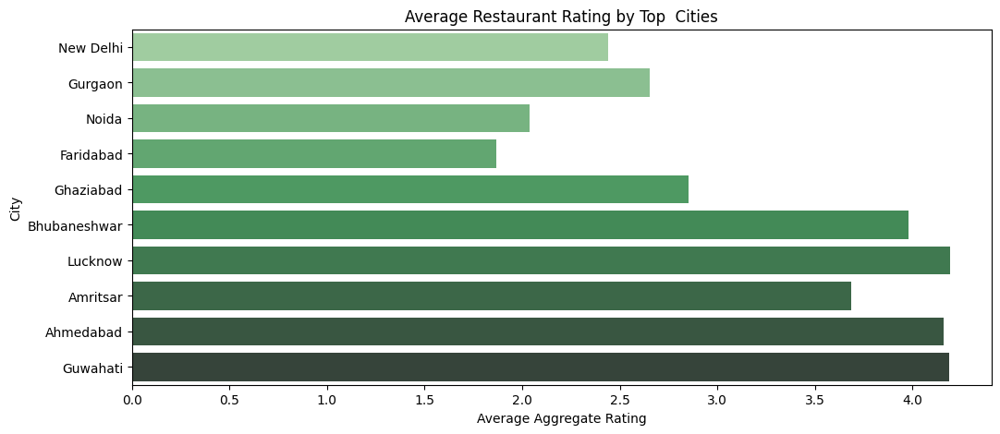

In [7]:
# count and average_rating the 
city_group = data.groupby('City').agg({'Restaurant Name': 'count', 'Aggregate rating': 'mean'}).rename(columns={'Restaurant Name': 'Restaurant Count'})

# Showing the top cities by 10 number of restaurants
top_cities = city_group.sort_values(by='Restaurant Count', ascending=False).head(10)
top_cities

# Visualizing 
plt.figure(figsize=(10,4))
sns.barplot(x=top_cities['Restaurant Count'], y=top_cities.index, palette='Blues_d')
plt.title('Top  Cities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()
#Average Restaurant Rating by Top  Cities
plt.figure(figsize=(12,5))
sns.barplot(x=top_cities['Aggregate rating'], y=top_cities.index, palette='Greens_d')
plt.title('Average Restaurant Rating by Top  Cities')
plt.xlabel('Average Aggregate Rating')
plt.ylabel('City')
plt.show()


In [8]:
# Correlation between the loctaion tags and the aggregate ratings
lat_rating_corr, _ = pearsonr(data['Latitude'], data['Aggregate rating'])
lon_rating_corr, _ = pearsonr(data['Longitude'], data['Aggregate rating'])

print(f"Correlation between Latitude and Aggregate rating: {lat_rating_corr:.3f}")
print(f"Correlation between Longitude and Aggregate rating: {lon_rating_corr:.3f}")


Correlation between Latitude and Aggregate rating: 0.001
Correlation between Longitude and Aggregate rating: -0.117


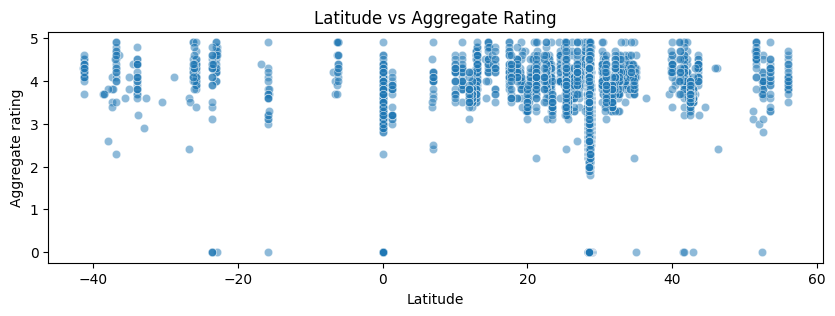

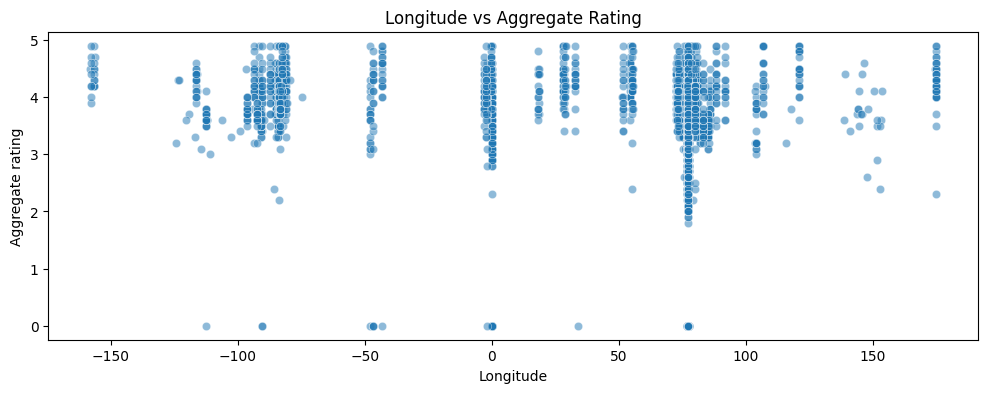

In [9]:
#visualisation with scatter_plot
plt.figure(figsize=(10,3))
sns.scatterplot(x='Latitude', y='Aggregate rating', data=data, alpha=0.5)
plt.title('Latitude vs Aggregate Rating')
plt.show()

plt.figure(figsize=(12,4))
sns.scatterplot(x='Longitude', y='Aggregate rating', data=data, alpha=0.5)
plt.title('Longitude vs Aggregate Rating')
plt.show()


In [57]:
# cleaning the data to drop null or no values etc since there are 9 such cols and some rows at the dataset
data = data.dropna(subset=['Latitude', 'Longitude', 'Restaurant Name'])

# showing the map with the average lat/lon
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=2)

# visualizing the locations as points
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Adding the restaurants as marker points with popup showing the name and optionally country/city/etc.
for idx, row in data.iterrows():
    popup_text = f"Name: {row['Restaurant Name']}<br>City: {row['City']}<br>Country Code: {row['Country Code']}"
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text,
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

restaurant_map.save('all_restaurants_map.html')
restaurant_map